In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from ydata_profiling import ProfileReport
from sklearn.preprocessing import LabelEncoder, StandardScaler
import pickle 


In [2]:
df = pd.read_csv(r"C:\Users\harsha.martha\Downloads\Training_Data.csv")
df.head()

,WellID,Subarea,Operator,County,Completion.Date,Completion.Year,Surface.Latitude,Surface.Longitude,Depth.Total.Driller..ft.,WB.Spacing.Proxy,...,Between_Zone,Frac.Stages,Treatment.Records,Fluid.Water..Gals.,Acid..Gals.,Gel.x.link..Gals.,Other..Gals.,Proppant...Total..lbs.,Fluid...Total..lbs.,EUR_o..Mstb.
0,2,E,PIONEER NATURAL RESOURCES USA INC,GLASSCOCK,37698,2003,31.65753,-101.72135,8550,160,...,SPBR_U --> WFMP,3.0,6,0.0,3500.0,187446.0,0.0,471330.0,190946.0,40.200000
1,3,D,PIONEER NATURAL RESOURCES USA INC,GLASSCOCK,37698,2003,31.71566,-101.71787,8550,40,...,CLFK --> WFMP,3.0,8,0.0,5000.0,201390.0,0.0,476570.0,206390.0,39.050383
2,5,D,ENDEAVOR ENERGY RESOURCES LIMITED PRTS,GLASSCOCK,38022,2004,31.95401,-101.74911,10500,20,...,CLFK --> WFMP,1.0,1,334900.0,0.0,0.0,0.0,553020.0,334900.0,51.856000
3,7,F,ENDEAVOR ENERGY RESOURCES LIMITED PRTS,GLASSCOCK,37714,2003,31.70024,-101.52357,8900,80,...,CLFK --> WFMP,1.0,1,247212.0,0.0,0.0,0.0,265000.0,247212.0,22.156000
4,10,E,PIONEER NATURAL RESOURCES USA INC,GLASSCOCK,37733,2003,31.69134,-101.72307,8575,Over 160,...,SPBR_U --> WFMP,3.0,8,0.0,5000.0,196636.0,0.0,318180.0,201636.0,45.276000


In [3]:
len(df)

1359

In [3]:
df.describe()

,WellID,Completion.Date,Completion.Year,Surface.Latitude,Surface.Longitude,Depth.Total.Driller..ft.,Frac.Stages,Treatment.Records,Fluid.Water..Gals.,Acid..Gals.,Gel.x.link..Gals.,Other..Gals.,Proppant...Total..lbs.,Fluid...Total..lbs.,EUR_o..Mstb.
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1344.000000,1359.000000,1.267000e+03,1.267000e+03,1.267000e+03,1.267000e+03,1.268000e+03,1.267000e+03,1359.000000
mean,1126.690949,39472.030169,2007.579102,31.702141,-101.791068,9759.735099,3.546875,6.048565,1.906650e+05,1.998446e+04,3.770339e+05,1.333513e+04,2.302522e+06,6.010185e+05,42.518302
std,653.655021,1116.399197,3.054156,0.142058,0.226129,1086.031888,2.457842,4.606360,1.202051e+06,2.850966e+05,4.579265e+05,1.368860e+05,6.161131e+07,1.264323e+06,28.542843
min,2.000000,37625.000000,2003.000000,31.397080,-102.243200,8000.000000,1.000000,1.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.675000e+04,1.008000e+03,0.248000
25%,552.500000,38486.000000,2005.000000,31.583640,-101.992865,8526.000000,1.000000,2.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.917932e+05,2.787500e+05,25.416562
50%,1135.000000,39429.000000,2007.000000,31.719500,-101.738010,10130.000000,3.000000,6.000000,0.000000e+00,6.000000e+03,2.324120e+05,0.000000e+00,4.813000e+05,4.100880e+05,36.412000
75%,1699.500000,40612.000000,2011.000000,31.812335,-101.621260,10574.000000,5.000000,8.000000,2.797720e+05,1.287500e+04,5.154310e+05,0.000000e+00,7.674490e+05,7.350270e+05,51.351000
max,2251.000000,41197.000000,2012.000000,31.999800,-101.392310,12510.000000,15.000000,24.000000,4.166337e+07,9.999990e+06,6.053124e+06,2.356200e+06,2.194438e+09,4.166337e+07,333.520000


In [4]:
#checking if dataset has any null values
df.isnull().values.any()


True

In [5]:
#printing out number of rows with null values
df.isnull().any(axis=1).sum()

154

In [6]:
#printing out columns which has null value
df.columns[df.isnull().any()].tolist()

['WB.Spacing.Proxy',
 'SPBY.Spacing.Proxy',
 'Frac.Stages',
 'Fluid.Water..Gals.',
 'Acid..Gals.',
 'Gel.x.link..Gals.',
 'Other..Gals.',
 'Proppant...Total..lbs.',
 'Fluid...Total..lbs.']

In [7]:
#printing the data types of these columns which contain null values
df.dtypes[['WB.Spacing.Proxy',
 'SPBY.Spacing.Proxy',
 'Frac.Stages',
 'Fluid.Water..Gals.',
 'Acid..Gals.',
 'Gel.x.link..Gals.',
 'Other..Gals.',
 'Proppant...Total..lbs.',
 'Fluid...Total..lbs.']]

WB.Spacing.Proxy           object
SPBY.Spacing.Proxy         object
Frac.Stages               float64
Fluid.Water..Gals.        float64
Acid..Gals.               float64
Gel.x.link..Gals.         float64
Other..Gals.              float64
Proppant...Total..lbs.    float64
Fluid...Total..lbs.       float64
dtype: object

In [27]:
null_cols = ['WB.Spacing.Proxy',
 'SPBY.Spacing.Proxy',
 'Frac.Stages',
 'Fluid.Water..Gals.',
 'Acid..Gals.',
 'Gel.x.link..Gals.',
 'Other..Gals.',
 'Proppant...Total..lbs.',
 'Fluid...Total..lbs.']

In [14]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1359 entries, 0 to 1358
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   WellID                    1359 non-null   int64  
 1   Subarea                   1359 non-null   object 
 2   Operator                  1359 non-null   object 
 3   County                    1359 non-null   object 
 4   Completion.Date           1359 non-null   int64  
 5   Completion.Year           1359 non-null   int64  
 6   Surface.Latitude          1359 non-null   float64
 7   Surface.Longitude         1359 non-null   float64
 8   Depth.Total.Driller..ft.  1359 non-null   int64  
 9   WB.Spacing.Proxy          1296 non-null   object 
 10  SPBY.Spacing.Proxy        1296 non-null   object 
 11  Deepest_Zone              1359 non-null   object 
 12  Between_Zone              1359 non-null   object 
 13  Frac.Stages               1344 non-null   float64
 14  Treatmen

In [20]:
#print out all the column which have more than 90% unique values
for column in df.columns:
    unique_values = set(df[column])
    if len(unique_values) >= 0.9*len(df):
        print("{} : {}".format(column, len(unique_values)))

WellID : 1359
Surface.Latitude : 1344
Surface.Longitude : 1344
EUR_o..Mstb. : 1328


In [21]:
#print out all the column which have more than 80% unique values
for column in df.columns:
    unique_values = set(df[column])
    if len(unique_values) >= 0.8*len(df):
        print("{} : {}".format(column, len(unique_values)))

WellID : 1359
Surface.Latitude : 1344
Surface.Longitude : 1344
Proppant...Total..lbs. : 1179
Fluid...Total..lbs. : 1219
EUR_o..Mstb. : 1328


In [41]:
#printing value counts of non numercial columns value counts
for col in ['WB.Spacing.Proxy','SPBY.Spacing.Proxy',]:
    print(col,df[col].value_counts())

WB.Spacing.Proxy 40          577
80          471
160         160
20           48
Over 160     39
Sub 20        1
Name: WB.Spacing.Proxy, dtype: int64
SPBY.Spacing.Proxy 40          561
80          273
20          166
160         137
Over 160    110
Sub 20       49
Name: SPBY.Spacing.Proxy, dtype: int64


In [4]:
# Generate a profile report to understand the data distribution and data itself
profile = ProfileReport(df, explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [43]:
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Find pairs of columns with correlation greater than 0.8
highly_correlated_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            pair = (correlation_matrix.columns[i], correlation_matrix.columns[j])
            highly_correlated_pairs.append(pair)

for pair in highly_correlated_pairs:
    print(f"Correlation between {pair[0]} and {pair[1]}: {correlation_matrix.loc[pair[0], pair[1]]}")

Correlation between Completion.Date and Completion.Year: 0.9957317224459973
Correlation between Frac.Stages and Treatment.Records: 0.8945952402353136
Correlation between Fluid.Water..Gals. and Fluid...Total..lbs.: 0.9019057543767007


C:\Users\harsha.martha\AppData\Local\Temp\ipykernel_30004\1889803324.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


In [50]:

# Define a threshold for IQR (e.g., 1.5)
iqr_threshold = 1.5

# Identify columns with outliers based on the IQR threshold
columns_with_outliers = []
numeric_columns = df.select_dtypes(include=['number']).columns
print(numeric_columns)
for column in numeric_columns:
    # Calculate the first quartile (Q1) and third quartile (Q3)
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)

    # Calculate the IQR for the column
    IQR = Q3 - Q1
     # Identify outliers based on the IQR threshold
    outliers = ((df[column] < (Q1 - iqr_threshold * IQR)) | (df[column] > (Q3 + iqr_threshold * IQR)))

    # Check if there are any outliers in the column
    if outliers.any():
        print(column)

Index(['WellID', 'Completion.Date', 'Completion.Year', 'Surface.Latitude',
       'Surface.Longitude', 'Depth.Total.Driller..ft.', 'Frac.Stages',
       'Treatment.Records', 'Fluid.Water..Gals.', 'Acid..Gals.',
       'Gel.x.link..Gals.', 'Other..Gals.', 'Proppant...Total..lbs.',
       'Fluid...Total..lbs.', 'EUR_o..Mstb.'],
      dtype='object')
Frac.Stages
Treatment.Records
Fluid.Water..Gals.
Acid..Gals.
Gel.x.link..Gals.
Other..Gals.
Proppant...Total..lbs.
Fluid...Total..lbs.
EUR_o..Mstb.


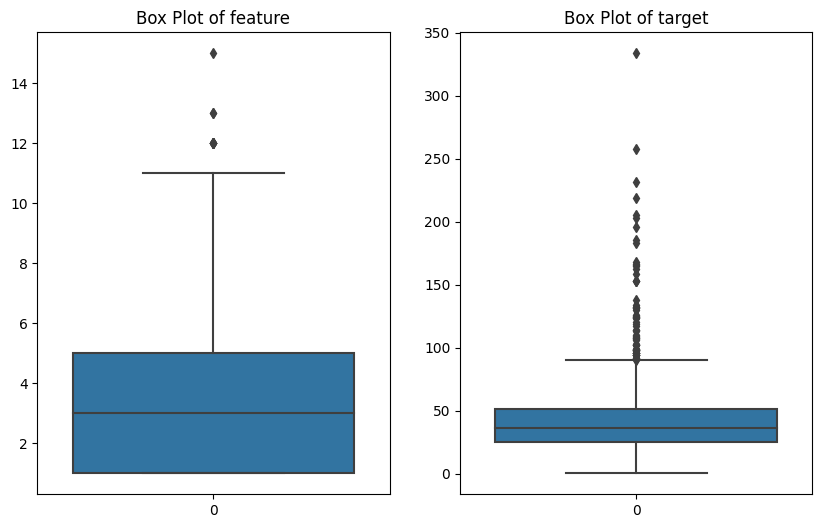

In [56]:
#sns.boxplot(x='EUR_o..Mstb.', y='Frac.Stages', data=df)
# sns.boxplot(df['Frac.Stages'])
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
sns.boxplot(data=df['Frac.Stages'])
plt.title(f'Box Plot of feature')
plt.subplot(1, 2, 2)
sns.boxplot(data = df['EUR_o..Mstb.'])
plt.title(f'Box Plot of target')
plt.show()

In [57]:
df[df['Frac.Stages']>14]

,WellID,Subarea,Operator,County,Completion.Date,Completion.Year,Surface.Latitude,Surface.Longitude,Depth.Total.Driller..ft.,WB.Spacing.Proxy,...,Between_Zone,Frac.Stages,Treatment.Records,Fluid.Water..Gals.,Acid..Gals.,Gel.x.link..Gals.,Other..Gals.,Proppant...Total..lbs.,Fluid...Total..lbs.,EUR_o..Mstb.
829,1383,B,BERRY OIL COMPANY,MIDLAND,40767,2011,31.6993,-101.94911,11731,80,...,SPBR_L --> ATOKA,15.0,15,0.0,0.0,804672.0,0.0,613084.0,804672.0,0.292


In [58]:
df[df['EUR_o..Mstb.']>300]

,WellID,Subarea,Operator,County,Completion.Date,Completion.Year,Surface.Latitude,Surface.Longitude,Depth.Total.Driller..ft.,WB.Spacing.Proxy,...,Between_Zone,Frac.Stages,Treatment.Records,Fluid.Water..Gals.,Acid..Gals.,Gel.x.link..Gals.,Other..Gals.,Proppant...Total..lbs.,Fluid...Total..lbs.,EUR_o..Mstb.
284,462,D,PARSLEY ENERGY OPERATIONS LLC,GLASSCOCK,41120,2012,31.74934,-101.59212,10634,NaN,...,#VALUE!,1.0,1,0.0,0.0,2213862.0,0.0,1429120.0,2213862.0,333.52


# we will not remove any outliers becoz even these outliers have significant impact on target value

# conclusion 1

#conclusions

1) WB.Spacing.Proxy and WB.Spacing.Proxy are numerical + ordinal data --> convert it to pure numeric

#very high correlation features that needs to be removed

1) Completion.Year (Completion.Date is highly overall correlated with Completion.Year, 0.99)
2) Between_Zone (Deepest_Zone is highly overall correlated with Between_Zone, 0.99, less correlation to target)
3) Subarea (Subarea is highly overall correlated with County, 0.89, less and oppsite to approx county )
4) WellID its pure unique values or indentifier
5) Treatment.Records (Frac.Stages is highly overall correlated with Treatment.Records, 0.93, less corr to target)

#replace null values of the remaining null containing features
1) Frac.Stages column we can use Mean value becoz data is not skewed
2) SPBY.Spacing.Proxy, WB.Spacing.Proxy, Fluid.Water..Gals. column we can use median value 
3) 'Acid..Gals.','Gel.x.link..Gals.','Other..Gals.','Proppant...Total..lbs.','Fluid...Total..lbs.' we use median becoz these data is skewed



# model test scenarios
1) with the conclusion 1 scenario
2) with conclusion 1 + one_hot_encoding of county, Deepest_Zone
3) 

# with the conclusion 1 scenario : 


In [5]:
#preprocessing of the data

#orderinal_median = ['WB.Spacing.Proxy', 'SPBY.Spacing.Proxy'] 

wb_replace = {'Over 160' : '180', 'Sub 20': '10'}
df['WB.Spacing.Proxy'].replace(wb_replace, inplace=True)
df['SPBY.Spacing.Proxy'].replace(wb_replace, inplace=True)
WB_median_value = df['WB.Spacing.Proxy'].median()
SPBY_median_value = df['SPBY.Spacing.Proxy'].median()
print('WB.Spacing.Proxy median value: ',WB_median_value)
print('SPBY.Spacing.Proxy median value: ',SPBY_median_value)
df['WB.Spacing.Proxy'].fillna(WB_median_value, inplace=True)
df['SPBY.Spacing.Proxy'].fillna(SPBY_median_value, inplace=True)

df['WB.Spacing.Proxy'] = df['WB.Spacing.Proxy'].astype('int32')
df['SPBY.Spacing.Proxy'] = df['SPBY.Spacing.Proxy'].astype('int32')


#mean = ['Frac.Stages']
Frac_mean = df['Frac.Stages'].mean()
print('Frac.Stages mean value :',Frac_mean)
df['Frac.Stages'].fillna(Frac_mean, inplace=True)


#median = ['Fluid.Water..Gals.','Acid..Gals.','Gel.x.link..Gals.','Other..Gals.','Proppant...Total..lbs.','Fluid...Total..lbs.']

median_change = ['Fluid.Water..Gals.','Acid..Gals.','Gel.x.link..Gals.','Other..Gals.','Proppant...Total..lbs.','Fluid...Total..lbs.']

for col in median_change:
    col_median = df[col].median()
    print("feature name {} : {} median value".format(col,col_median))
    df[col].fillna(col_median, inplace=True)

#dropping non informative columns
drop_cols = [ 'Completion.Year', 'Between_Zone', 'Subarea' ,'WellID','Treatment.Records']
df.drop(drop_cols, axis=1, inplace=True)


#label encoding and standardscaler

for col in df.columns:
    if df[col].dtype == 'O':
        print(col)
        label_encoder = LabelEncoder()
        df[col] = label_encoder.fit_transform(df[col])
        with open('{}.pkl'.format(col), 'wb') as file:
            pickle.dump(label_encoder, file)
            
            
ss = StandardScaler()
target_values = df['EUR_o..Mstb.']
df.drop('EUR_o..Mstb.', axis=1, inplace=True)
df = ss.fit_transform(df)
with open('standard_scaler.pkl', 'wb') as file:
    pickle.dump(ss, file)



WB.Spacing.Proxy median value:  80.0
SPBY.Spacing.Proxy median value:  40.0
Frac.Stages mean value : 3.546875
feature name Fluid.Water..Gals. : 0.0 median value
feature name Acid..Gals. : 6000.0 median value
feature name Gel.x.link..Gals. : 232412.0 median value
feature name Other..Gals. : 0.0 median value
feature name Proppant...Total..lbs. : 481300.0 median value
feature name Fluid...Total..lbs. : 410088.0 median value
Operator
County
Deepest_Zone


In [6]:
target_values

0        40.200000
1        39.050383
2        51.856000
3        22.156000
4        45.276000
           ...    
1354     37.424000
1355     33.536000
1356    109.772000
1357     24.508000
1358     37.556000
Name: EUR_o..Mstb., Length: 1359, dtype: float64

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df, target_values, test_size=0.15, random_state=5)

In [9]:
#PyCaret is an open-source, low-code machine learning library in Python that automates machine learning workflows.
import pycaret
from pycaret.regression import *


In [13]:
### load sample dataset from pycaret dataset module
from pycaret.datasets import get_data
data = get_data('insurance')
# import pycaret regression and init setup
from pycaret.regression import *
s = setup(data, target = 'charges', session_id = 123)

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


TypeError: unhashable type: 'list'

In [12]:
exp.setup(df, target = target_values, session_id = 6,train_size=0.85,max_encoding_ohe = 10)
exp.compare_models()

TypeError: unhashable type: 'list'

In [10]:
s = setup(df, target = target_values, session_id = 6,train_size=0.85,max_encoding_ohe = 10)
best = compare_models()

TypeError: unhashable type: 'list'

In [57]:
# Training the Model
from sklearn.linear_model import LinearRegression
from sklearn.metrics import root_mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree = 2)
X_poly = poly_reg.fit_transform(get_config('X_train'))
lin_reg_2 = LinearRegression()
lin_reg_2.fit(X_poly, get_config('y_train'))
pred = lin_reg_2.predict(poly_reg.transform(get_config('X_test')))
print(root_mean_squared_error(get_config('y_test'),pred))

48.887768


In [36]:
lin_reg_2 = LinearRegression()
lin_reg_2.fit(get_config('X_train'), get_config('y_train'))
pred = lin_reg_2.predict(get_config('X_test'))
print(root_mean_squared_error(get_config('y_test'),pred))

23.064857
23.064857


In [37]:
from sklearn.ensemble import GradientBoostingRegressor
reg = GradientBoostingRegressor(random_state=0)
reg.fit(get_config('X_train'), get_config('y_train'))
reg_pred = reg.predict(get_config('X_test'))
print(root_mean_squared_error(get_config('y_test'),reg_pred))

24.09437222902921


In [58]:
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

model = XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(model, get_config('X_train'), get_config('y_train'), scoring='neg_root_mean_squared_error', cv=cv, n_jobs=-1)
model.fit(get_config('X_train'), get_config('y_train'))
yhat = model.predict(get_config('X_test'))
print(scores)
print(root_mean_squared_error(get_config('y_test'),yhat))

[-20.52066231 -27.54381371 -22.70485306 -29.38179398 -26.11676598
 -20.56770897 -23.48221588 -30.38665962 -21.86819077 -34.94603729
 -20.62620163 -30.00289154 -23.1309185  -32.22037506 -34.36165237
 -23.16528702 -30.26769447 -23.03813171 -20.1805191  -17.87425804
 -29.54505157 -25.40941238 -24.75728798 -23.9732132  -35.88441849
 -20.14827538 -28.57024765 -19.5497036  -20.71193504 -25.01629639]
24.585138


In [18]:
df = pd.read_csv(r"C:\Users\harsha.martha\Downloads\Training_Data.csv")


# with conclusion 1 + one_hot_encoding of county, Deepest_Zone

In [19]:
#preprocessing of the data

#orderinal_median = ['WB.Spacing.Proxy', 'SPBY.Spacing.Proxy'] 

wb_replace = {'Over 160' : '180', 'Sub 20': '10'}
df['WB.Spacing.Proxy'].replace(wb_replace, inplace=True)
df['SPBY.Spacing.Proxy'].replace(wb_replace, inplace=True)
WB_median_value = df['WB.Spacing.Proxy'].median()
SPBY_median_value = df['SPBY.Spacing.Proxy'].median()
print('WB.Spacing.Proxy median value: ',WB_median_value)
print('SPBY.Spacing.Proxy median value: ',SPBY_median_value)
df['WB.Spacing.Proxy'].fillna(WB_median_value, inplace=True)
df['SPBY.Spacing.Proxy'].fillna(SPBY_median_value, inplace=True)

df['WB.Spacing.Proxy'] = df['WB.Spacing.Proxy'].astype('int32')
df['SPBY.Spacing.Proxy'] = df['SPBY.Spacing.Proxy'].astype('int32')


#mean = ['Frac.Stages']
Frac_mean = df['Frac.Stages'].mean()
print('Frac.Stages mean value :',Frac_mean)
df['Frac.Stages'].fillna(Frac_mean, inplace=True)


#median = ['Fluid.Water..Gals.','Acid..Gals.','Gel.x.link..Gals.','Other..Gals.','Proppant...Total..lbs.','Fluid...Total..lbs.']

median_change = ['Fluid.Water..Gals.','Acid..Gals.','Gel.x.link..Gals.','Other..Gals.','Proppant...Total..lbs.','Fluid...Total..lbs.']

for col in median_change:
    col_median = df[col].median()
    print("feature name {} : {} median value".format(col,col_median))
    df[col].fillna(col_median, inplace=True)

#dropping non informative columns
drop_cols = [ 'Completion.Year', 'Between_Zone', 'Subarea' ,'WellID','Treatment.Records']
df.drop(drop_cols, axis=1, inplace=True)



WB.Spacing.Proxy median value:  80.0
SPBY.Spacing.Proxy median value:  40.0
Frac.Stages mean value : 3.546875
feature name Fluid.Water..Gals. : 0.0 median value
feature name Acid..Gals. : 6000.0 median value
feature name Gel.x.link..Gals. : 232412.0 median value
feature name Other..Gals. : 0.0 median value
feature name Proppant...Total..lbs. : 481300.0 median value
feature name Fluid...Total..lbs. : 410088.0 median value


In [20]:
# Perform one-hot encoding for the 'Color' and 'Shape' columns
df = pd.get_dummies(df, columns=['County', 'Deepest_Zone'],dtype='int32')
df.head()

,Operator,Completion.Date,Surface.Latitude,Surface.Longitude,Depth.Total.Driller..ft.,WB.Spacing.Proxy,SPBY.Spacing.Proxy,Frac.Stages,Fluid.Water..Gals.,Acid..Gals.,...,County_REAGAN,Deepest_Zone_#VALUE!,Deepest_Zone_ATOKA,Deepest_Zone_FUSS,Deepest_Zone_MISS,Deepest_Zone_SIL_DEV,Deepest_Zone_SPBR_L,Deepest_Zone_STRAWN,Deepest_Zone_WFMP,Deepest_Zone_WOOD
0,PIONEER NATURAL RESOURCES USA INC,37698,31.65753,-101.72135,8550,160,40,3.0,0.0,3500.0,...,0,0,0,0,0,0,0,0,1,0
1,PIONEER NATURAL RESOURCES USA INC,37698,31.71566,-101.71787,8550,40,40,3.0,0.0,5000.0,...,0,0,0,0,0,0,0,0,1,0
2,ENDEAVOR ENERGY RESOURCES LIMITED PRTS,38022,31.95401,-101.74911,10500,20,80,1.0,334900.0,0.0,...,0,0,0,0,0,0,0,0,1,0
3,ENDEAVOR ENERGY RESOURCES LIMITED PRTS,37714,31.70024,-101.52357,8900,80,80,1.0,247212.0,0.0,...,0,0,0,0,0,0,0,0,1,0
4,PIONEER NATURAL RESOURCES USA INC,37733,31.69134,-101.72307,8575,180,40,3.0,0.0,5000.0,...,0,0,0,0,0,0,0,0,1,0


In [88]:
df.columns

Index(['Operator', 'Completion.Date', 'Surface.Latitude', 'Surface.Longitude',
       'Depth.Total.Driller..ft.', 'WB.Spacing.Proxy', 'SPBY.Spacing.Proxy',
       'Frac.Stages', 'Fluid.Water..Gals.', 'Acid..Gals.', 'Gel.x.link..Gals.',
       'Other..Gals.', 'Proppant...Total..lbs.', 'Fluid...Total..lbs.',
       'EUR_o..Mstb.', 'County_GLASSCOCK', 'County_MIDLAND', 'County_REAGAN',
       'Deepest_Zone_#VALUE!', 'Deepest_Zone_ATOKA', 'Deepest_Zone_FUSS',
       'Deepest_Zone_MISS', 'Deepest_Zone_SIL_DEV', 'Deepest_Zone_SPBR_L',
       'Deepest_Zone_STRAWN', 'Deepest_Zone_WFMP', 'Deepest_Zone_WOOD'],
      dtype='object')

In [21]:
for col in ['Operator']:
    label_encoder = LabelEncoder()
    df[col] = label_encoder.fit_transform(df[col])
    with open('{}.pkl'.format(col), 'wb') as file:
        pickle.dump(label_encoder, file)
            

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1359 entries, 0 to 1358
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Operator                  1359 non-null   int32  
 1   Completion.Date           1359 non-null   int64  
 2   Surface.Latitude          1359 non-null   float64
 3   Surface.Longitude         1359 non-null   float64
 4   Depth.Total.Driller..ft.  1359 non-null   int64  
 5   WB.Spacing.Proxy          1359 non-null   int32  
 6   SPBY.Spacing.Proxy        1359 non-null   int32  
 7   Frac.Stages               1359 non-null   float64
 8   Fluid.Water..Gals.        1359 non-null   float64
 9   Acid..Gals.               1359 non-null   float64
 10  Gel.x.link..Gals.         1359 non-null   float64
 11  Other..Gals.              1359 non-null   float64
 12  Proppant...Total..lbs.    1359 non-null   float64
 13  Fluid...Total..lbs.       1359 non-null   float64
 14  EUR_o..M

In [23]:
ss = StandardScaler()
target_values = df['EUR_o..Mstb.']
df.drop('EUR_o..Mstb.', axis=1, inplace=True)
df = ss.fit_transform(df)
with open('standard_scaler.pkl', 'wb') as file:
    pickle.dump(ss, file)


In [25]:
#normalize_method, default = ‘zscore’
#robust scales and translates each feature according to the Interquartile range. When the dataset contains outliers, the robust scaler often gives better results.
# pca = True, pca_components = 10
# remove_multicollinearity = True, multicollinearity_threshold = 0.3
#   feature_selection = True
# low_variance_threshold = 0.1
# transformation = True



s_encoded = setup(df, target = target_values, session_id = 12,train_size=0.85)
best_encoded = compare_models()

TypeError: unhashable type: 'list'